# Clinical CLL analysis

In [1]:
import readfcs
import cytovi
import scanpy as sc
import anndata as ad
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib
import os
import pandas as pd
from scipy.stats import mannwhitneyu, pearsonr

/home/projects/amit/floriani/mambaforge/envs/cytovi_gpu/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_use_gpu' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


In [3]:
os.chdir('/home/projects/amit/floriani/Lab/PROJECTS/FlowVI/notebooks/')
figure_dir = '../figures/figure5/'
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams["savefig.dpi"] = 300

sc.settings.figdir = figure_dir
sc.set_figure_params(dpi_save = 300)
sc.settings.n_jobs = 60

In [4]:
# read md
data_dir = '../data/raw/Flow cytometry/CLL/full_cohort/'
md = pd.read_csv(f'{data_dir}CytoVI_CLL_md_combined_updated.csv', dtype={'donor': str})

In [ ]:
# read data
vars_rm = ['Time', 'FSC-H', 'FSC-W', 'SSC-H', 'SSC-W']
fcs_files = os.listdir(f'{data_dir}fcs_files/')
adata_list = []
sample_num = 0

for fcs_file in fcs_files:
    if fcs_file.endswith('.fcs'):
        fcs_path = os.path.join(data_dir, 'fcs_files', fcs_file)
        adata = readfcs.read(fcs_path)
        adata = adata[:, [var for var in adata.var_names if var not in vars_rm]]

        # add md
        adata.obs['filename'] = fcs_file
        adata.obs['sample_id'] = sample_num
        adata.obs['donor'] = fcs_file.split('_')[1]

        adata.layers['raw'] = adata.X.copy()

        if adata.var_names.isin(['CD200 APC-A']).any():
            adata.var.rename(index={'CD200 APC-A': 'CD200',
                                    'CD5 APC-Cy7-A': 'CD5',
                                    'Anti-Lambda FITC-A': 'Lambda',
                                    'Anti-Kappa PE-A': 'Kappa',
                                    'CD19 PE-Cy7-A': 'CD19',
                                    'CD10 PerCP-Cy5.5-A': 'CD10',
                                    'CD20 V450-A': 'CD20',
                                    'CD45 V500-A': 'CD45'}, inplace=True)
    
        sample_num += 1
        adata_list.append(adata)

In [ ]:
# preprocess
for adata in adata_list:
    cytovi.pp.arcsinh(adata, global_scaling_factor=500, transform_scatter = True)
    cytovi.pp.scale(adata)

# combine in one adata
adata = cytovi.pp.merge_batches(adata_list)

In [ ]:
# merge adata with md
adata.obs = adata.obs.merge(md, on='donor', how='left')

In [ ]:
# some quick fix
adata.obs_names_make_unique()
adata.obs.index = adata.obs.index.astype(str)

In [ ]:
# convert columns to string
adata.obs['sample_name'] = adata.obs['sample_name'].astype(str)
adata.obs['Matutes criteria max 5'] = adata.obs['Matutes criteria max 5'].astype(str)


In [ ]:
# save anndata to disc
adata.write(f'{data_dir}processed/2024-08-29_CLL_full_cohort.h5ad')

In [4]:
# read again
adata = ad.read_h5ad(f'{data_dir}processed/2024-08-29_CLL_full_cohort.h5ad')

In [9]:
# select samples that met inclusion criteria and save (note: this excludes BM samples, duplicate patients and other entities)
adata_incl = adata[adata.obs['Inclusion'] == 1, :].copy()
adata_incl.write(f'{data_dir}processed/2024-08-29_CLL_full_cohort_inclusion.h5ad')

In [4]:
# read again
adata_incl = ad.read_h5ad(f'{data_dir}processed/2024-08-29_CLL_full_cohort_inclusion.h5ad')


AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer



# annotate reference model

In [5]:
# select patients for reference model
md_incl = adata_incl.obs.loc[:, md.columns].drop_duplicates()

ref_controls = ['4450281566', '4450429766', '1465636', '1436370', '1378832', '1357991', '1348325', '973484', '929066', '892896']
ref_cases = ['519782', '872446', '879464', '885153', '973522', '985725', '1222965', '1228089', '1312166', '1386252']

adata_ref = adata[adata.obs['donor'].isin(ref_controls + ref_cases), :].copy()
adata_ref.write(f'{data_dir}processed/2024-08-30_CLL_full_cohort_reference_model_100k.h5ad')

In [6]:
# read adata and trained reference model again
adata_ref = ad.read_h5ad('../data/raw/Flow cytometry/CLL/full_cohort/processed/2024-09-02_CLL_full_cohort_reference_model_100k_latent.h5ad')
model = cytovi.CytoVI.load('/home/labs/amit/floriani/Lab/PROJECTS/FlowVI/models/CLL/2024-09-02_CLL_reference_model', adata = adata_ref)

INFO     File /home/labs/amit/floriani/Lab/PROJECTS/FlowVI/models/CLL/2024-09-02_CLL_reference_model/model.pt      
         already downloaded                                                                                        


Text(0, 0.5, 'elbo_validation')

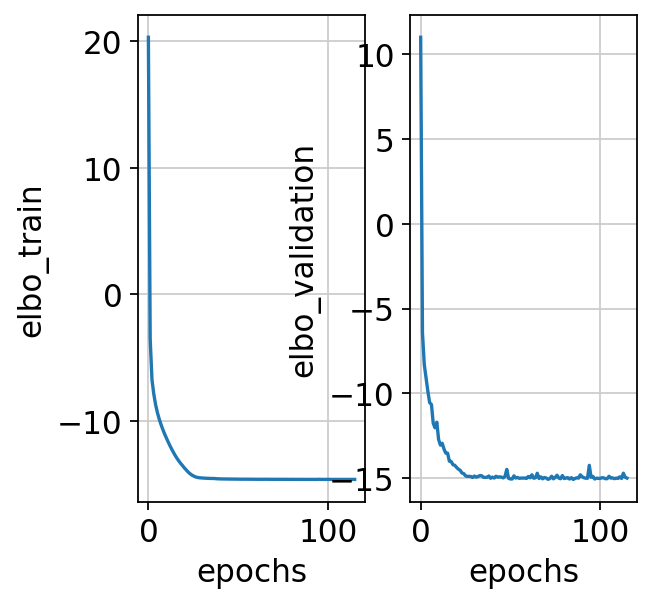

In [6]:
# check convergance
model.history
plt.subplot(1, 2, 1)
plt.plot(model.history['elbo_train'])
plt.xlabel('epochs')
plt.ylabel('elbo_train')

plt.subplot(1, 2, 2)
plt.plot(model.history['elbo_validation'])
plt.xlabel('epochs')
plt.ylabel('elbo_validation')

In [10]:
# get normalized expression
adata_ref.layers['imputed'] = model.get_normalized_expression(adata_ref, n_samples=10)

In [11]:
# cluster the latent
sc.tl.leiden(adata_ref, resolution=0.2, key_added='leiden_CytoVI')

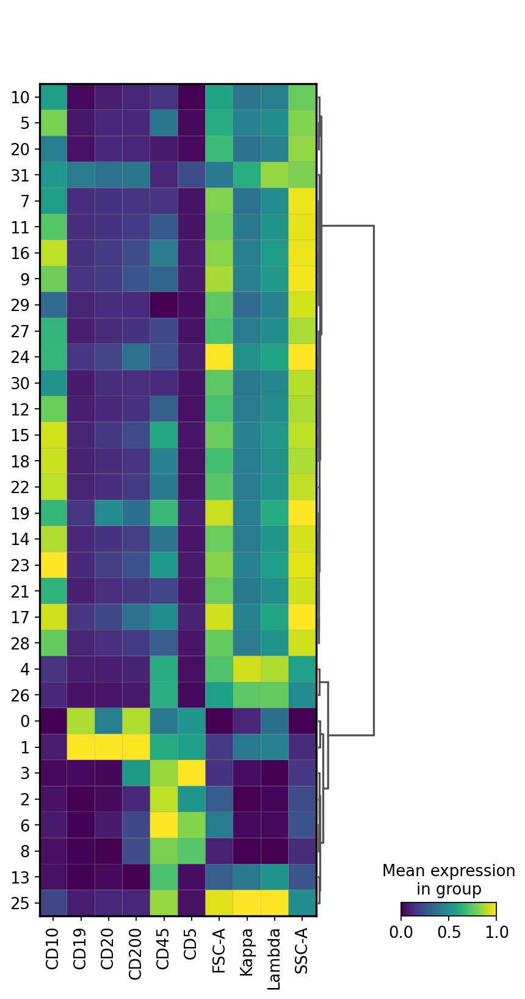

In [17]:
sc.pl.matrixplot(adata_ref, var_names=list(adata_ref.var_names), dendrogram=True, groupby='leiden_CytoVI', use_raw = False, layer = 'scaled', standard_scale='var')

In [ ]:
# annotate cells
annot_dict = {
    '10': 'Granulocytes',
    '5': 'Granulocytes',
    '20': 'Granulocytes',
    '31': 'Granulocytes',
    '7': 'Granulocytes',
    '11': 'Granulocytes',
    '16': 'Granulocytes',
    '9': 'Granulocytes',
    '29': 'Granulocytes',
    '27': 'Granulocytes',
    '24': 'Granulocytes',
    '30': 'Granulocytes',
    '12': 'Granulocytes',
    '15': 'Granulocytes',
    '18': 'Granulocytes',
    '22': 'Granulocytes',
    '19': 'Granulocytes',
    '14': 'Granulocytes',
    '23': 'Granulocytes',
    '21': 'Granulocytes',
    '17': 'Granulocytes',
    '28': 'Granulocytes',
    '4': 'Monocytes',
    '26': 'Monocytes',
    '25': 'Monocytes',
    '0': 'B cells',
    '1': 'B cells',
    '3': 'T cells',  
    '2': 'T cells',  
    '6': 'T cells',  
    '8': 'T cells',
    '13': 'NK cells'
}

adata_ref.obs['cell_type'] = adata_ref.obs['leiden_CytoVI'].map(annot_dict)

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


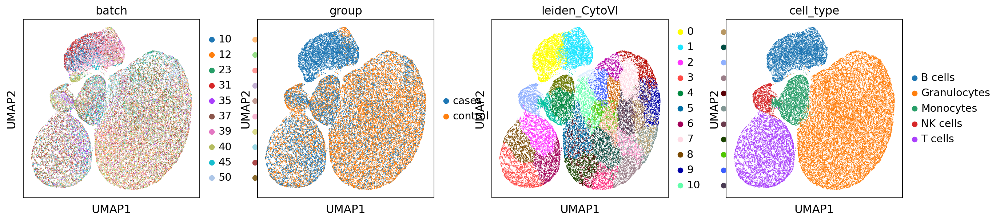

In [19]:
# plot
adata_ref_sub = cytovi.pp.subsample(adata_ref, n_obs = 100000, groupby = 'batch')
sc.pp.neighbors(adata_ref_sub, use_rep="X_CytoVI")
sc.tl.umap(adata_ref_sub)
adata_ref_sub.obs['cell_type'] = adata_ref_sub.obs['leiden_CytoVI'].map(annot_dict)
sc.pl.umap(adata_ref_sub, color = ['batch', 'group', 'leiden_CytoVI', 'cell_type'])

In [20]:
# save anndata to disk
adata_ref.write('../data/raw/Flow cytometry/CLL/full_cohort/processed/2024-09-03_CLL_full_cohort_reference_model_latent_annot.h5ad')

In [23]:
# dissect the B cells further
sc.tl.leiden(adata_ref, key_added="leiden_CytoVI_sub", resolution = 0.1, restrict_to=['cell_type', ['B cells']])

In [ ]:
# plot on subset
adata_ref_sub = cytovi.pp.subsample(adata_ref, n_obs = 100000, groupby = 'batch')
sc.pp.neighbors(adata_ref_sub, use_rep="X_CytoVI")
sc.tl.umap(adata_ref_sub)
sc.pl.umap(adata_ref_sub, color = list(adata_ref_sub.var_names), cmap= sns.color_palette("mako", as_cmap=True), use_raw = False, layer = 'scaled', ncols= 3)
sc.pl.umap(adata_ref_sub, color = ['batch', 'group', 'leiden_CytoVI_sub'])

In [28]:
# annotate
replace_dict = {
    'B cells,0': 'CLL cells',
    'B cells,1': 'CLL cells',
    'B cells,2': 'CLL cells',
    'B cells,3': 'CLL cells',
    'B cells,4': 'CLL cells',
    'B cells,5': 'CLL cells',
    'B cells,6': 'CLL cells',
    'B cells,7': 'B cells'
}

adata_ref.obs['cell_type'] = adata_ref.obs['leiden_CytoVI_sub'].replace(replace_dict)

In [ ]:
# plot on subset
adata_ref_sub = cytovi.pp.subsample(adata_ref, n_obs = 100000, groupby = 'batch')
sc.pp.neighbors(adata_ref_sub, use_rep="X_CytoVI")
sc.tl.umap(adata_ref_sub)
sc.pl.umap(adata_ref_sub, color = list(adata_ref_sub.var_names), cmap= sns.color_palette("mako", as_cmap=True), use_raw = False, layer = 'scaled', ncols= 3)
sc.pl.umap(adata_ref_sub, color = ['batch', 'group', 'leiden_CytoVI_sub', 'cell_type'])

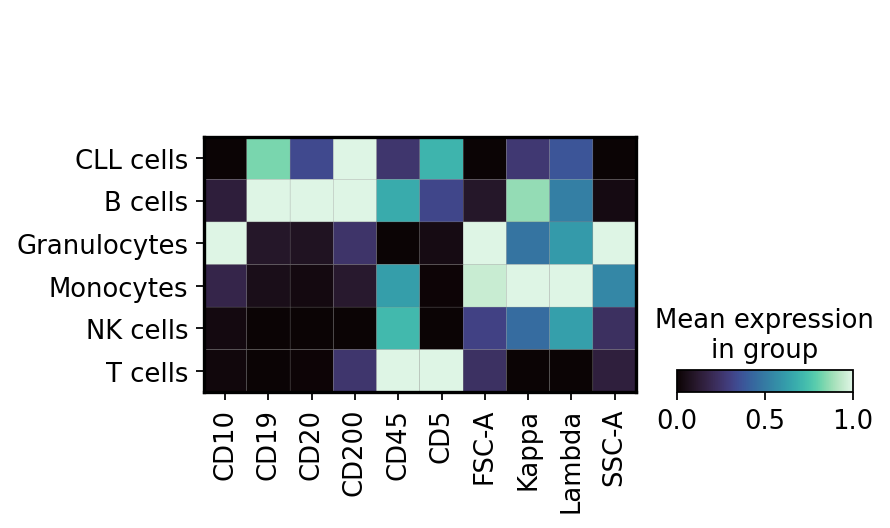

In [34]:
# plot heatmap
sc.pl.matrixplot(adata_ref_sub, var_names=list(adata_ref_sub.var_names), dendrogram=False, groupby='cell_type', use_raw = False, layer = 'scaled', standard_scale='var', cmap = 'mako', save = 'reference_model_cell_type.pdf')

In [31]:
# # save anndata to disk
# adata_ref.write('../data/raw/Flow cytometry/CLL/full_cohort/processed/2024-09-03_CLL_full_cohort_reference_model_latent_annot.h5ad')

In [5]:
# read again
adata_ref = ad.read_h5ad('../data/raw/Flow cytometry/CLL/full_cohort/processed/2024-09-03_CLL_full_cohort_reference_model_latent_annot.h5ad')

/tmp/ipykernel_38895/1878504038.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  freq_table = adata_ref.obs.groupby(['donor', 'cell_type']).size().unstack(fill_value=0)


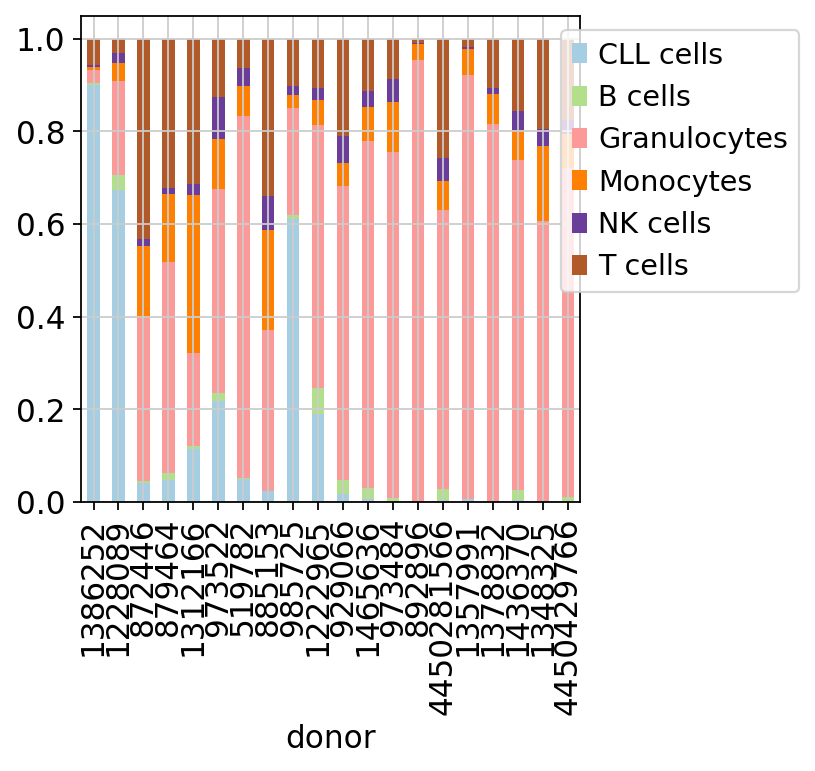

In [7]:
freq_table = adata_ref.obs.groupby(['donor', 'cell_type']).size().unstack(fill_value=0)
freq_table_normalized = freq_table.div(freq_table.sum(axis=1), axis=0)
group_order = adata_ref.obs[['donor', 'class']].drop_duplicates().sort_values('class')['donor'].to_list()
freq_table_normalized = freq_table_normalized.loc[group_order,:]
freq_table_normalized.plot.bar(stacked=True, cmap='Paired')
plt.legend(loc='upper center', bbox_to_anchor=(1.2, 1))

/home/projects/amit/floriani/mambaforge/envs/cytovi_gpu/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


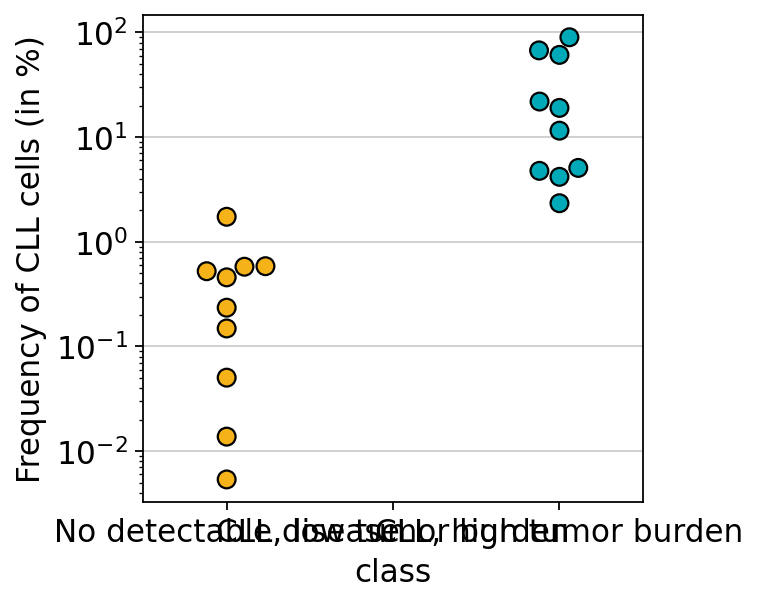

In [9]:
# plot frequencies
eps = 1e-5
res = pd.merge(freq_table_normalized.reset_index('donor'), md, on='donor')
res['freq CLL cells among total'] = res['freq CLL cells among total'].fillna(0)
res['freq CLL cells among total'] = (res['freq CLL cells among total']+ eps)*100

group_colors = {'CLL, high tumor burden': '#00A9B8', 'CLL, low tumor burden': '#3A528B', 'No detectable disease': '#F6B319'}
group_order = ['No detectable disease', 'CLL, low tumor burden', 'CLL, high tumor burden']

res['CLL cells eps'] = (res['CLL cells']+ eps)*100
# res['freq blasts of total eps'] = res['freq blasts of total'] + eps

g = sns.swarmplot(res, y='CLL cells eps', x='class', hue = 'class', palette = group_colors, order = group_order, s = 8, edgecolor = 'black', linewidth = 1)
plt.yscale('log')
plt.legend([],[], frameon = False)
# g.set_title('Frequency of CLL cells per group')
g.set_ylabel('Frequency of CLL cells (in %)')
plt.savefig(f'{figure_dir}scatterplot_reference_model_CLL.pdf')

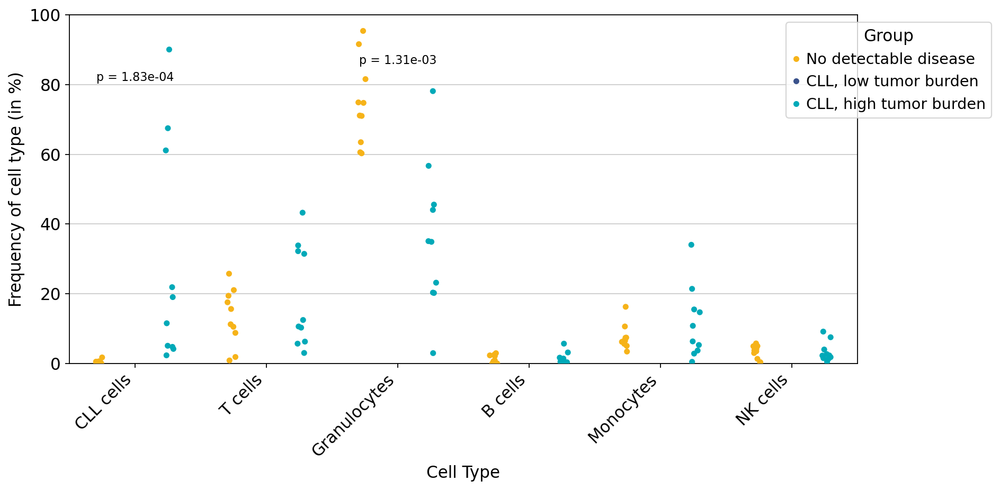

In [10]:
# Prepare the data for violin plots
cell_types = adata_ref.obs['cell_type'].drop_duplicates().values
freq_long = res.melt(id_vars=['donor', 'class'], var_name='cell_type', value_vars = cell_types, value_name='frequency')
freq_long['frequency'] = freq_long['frequency']*100

# Calculate Mann-Whitney U test p-values for each cell type
p_values = {}

for cell_type in cell_types:
    group_data = freq_long[freq_long['cell_type'] == cell_type]
    control_freq = group_data[group_data['class'] == 'No detectable disease']['frequency']
    cases_freq = group_data[group_data['class'] == 'CLL, high tumor burden']['frequency']
    if len(control_freq) > 0 and len(cases_freq) > 0: 
        _, p_val = mannwhitneyu(control_freq, cases_freq, alternative='two-sided')
        p_values[cell_type] = p_val
    else:
        p_values[cell_type] = None 

# Create violin plots
plt.figure(figsize=(12, 6))
ax = sns.stripplot(
    data=freq_long,
    x='cell_type',
    y='frequency',
    hue='class',
    palette=group_colors,
    dodge=True,
    hue_order = group_order
)

# Add p-value annotations above the violins
for i, cell_type in enumerate(freq_long['cell_type'].unique()):
    if cell_type in p_values and p_values[cell_type] is not None:
        p_val = p_values[cell_type]
        text = f"p = {p_val:.2e}" if p_val < 0.05 else "" 
        x_pos = i 
        y_pos = freq_long[freq_long['cell_type'] == cell_type]['frequency'].max() * 0.9 
        ax.text(x_pos, y_pos, text, ha='center', fontsize=10, color='black')

plt.ylim(0, 100)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Frequency of cell type (in %)')
plt.xlabel('Cell Type')
plt.legend(title='Group', bbox_to_anchor=(0.9, 1), loc='upper left')
plt.tight_layout()

# Save the figure
plt.savefig(f'{figure_dir}violinplot_cell_type_frequencies_reference_data.pdf')
plt.show()

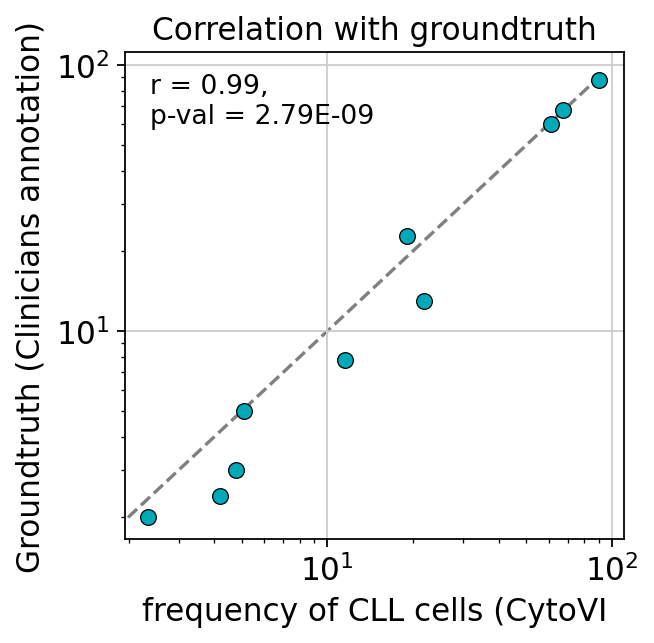

In [103]:
# correlate CLL cells freq with GT
res_cases = res[res['class']=='CLL, high tumor burden']

r, p = pearsonr(res_cases['CLL cells'], res_cases['freq CLL cells among total'])

ax = plt.subplot()
g = sns.scatterplot(res_cases, x='CLL cells eps', y='freq CLL cells among total', ax=ax, edgecolor='black', color = group_colors[0], s = 50, zorder= 2)
g.set_title('Correlation with groundtruth')
x0, x1 = g.get_xlim()
y0, y1 = g.get_ylim()
lims = [max(x0, y0), min(x1, y1)]
g.plot(lims, lims, color="grey", linestyle="dashed", label="x=y", zorder=1)
ax.set_xlabel('frequency of CLL cells (CytoVI')
ax.set_ylabel('Groundtruth (Clinicians annotation)')
ax.text(0.05, 0.90, f'r = {r:.2f}, \np-val = {p:.2E}', transform=ax.transAxes,
        horizontalalignment='left', verticalalignment='center', fontsize=12)
plt.xscale('log')
plt.yscale('log')
plt.legend([],[], frameon = False)
plt.savefig(f'{figure_dir}scatterplot_reference_model_CLL_vs_GT.pdf')

# query reference model

In [7]:
# read reference data again
adata_ref = ad.read_h5ad('../data/raw/Flow cytometry/CLL/full_cohort/processed/2024-09-03_CLL_full_cohort_reference_model_latent_annot.h5ad')


AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer



In [8]:
# subset query data
adata_incl.obs_names = adata_incl.obs_names.astype(str)
adata_query = adata_incl[~adata_incl.obs['donor'].isin(ref_controls + ref_cases), :].copy()
adata_query

AnnData object with n_obs × n_vars = 31101042 × 10
    obs: 'filename', 'sample_id', 'donor', 'batch', 'sample_name', 'group', 'diagnosis', 'Matutes criteria max 5', 'freq CLL cells among total', 'freq of CLL cells among B cells', 'light chain restriction', 'note', 'Clin_Batch', 'Inclusion', 'class'
    layers: 'raw', 'scaled', 'transformed'

In [9]:
# subsample reference data
adata_ref.obs_names = adata_ref.obs_names.astype(str)
adata_ref_sub = cytovi.pp.subsample(adata_ref, n_obs = 1000000, groupby = 'donor')
adata_ref_sub.obs_names_make_unique()

Group 1222965 has less observations than 50000 observations.Taking all group observations. Set replace to True to sample with replacement.
Group 973522 has less observations than 50000 observations.Taking all group observations. Set replace to True to sample with replacement.


In [10]:
# load query data into model
model_query = cytovi.CytoVI.load_query_data(adata = adata_query, reference_model=model)
model_query.is_trained = True

# obtain latent space
adata_query.obsm["X_CytoVI"] = model_query.get_latent_representation() 

# impute labels
adata_query.obs['imp_label'], adata_query.obs['imp_uncertainty'] = model_query.impute_categories_from_reference(adata_ref_sub, cat_key = 'cell_type', n_neighbors=20, return_uncertainty = True)

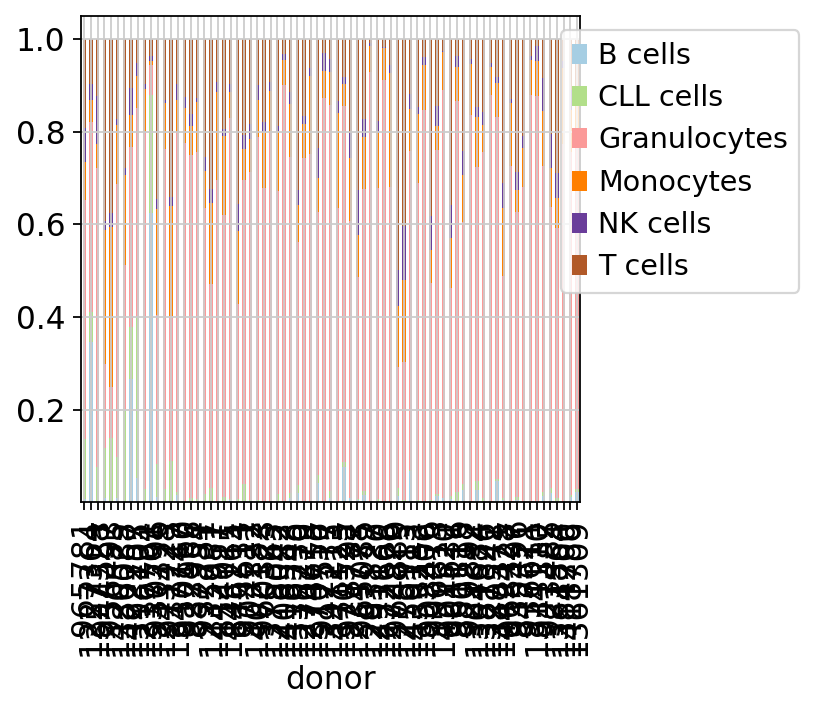

In [35]:
freq_table = adata_query.obs.groupby(['donor', 'imp_label']).size().unstack(fill_value=0)
freq_table_normalized = freq_table.div(freq_table.sum(axis=1), axis=0)
group_order = adata_query.obs[['donor', 'class']].drop_duplicates().sort_values('class')['donor'].to_list()
freq_table_normalized = freq_table_normalized.loc[group_order,:]
freq_table_normalized.plot.bar(stacked=True, cmap='Paired')
plt.legend(loc='upper center', bbox_to_anchor=(1.2, 1))

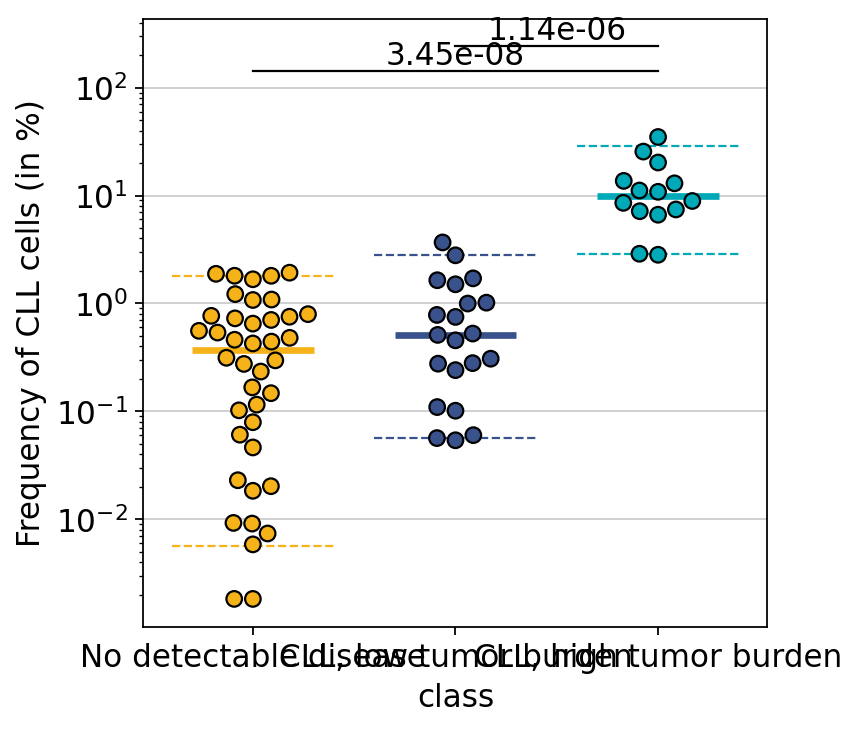

In [84]:
# Merge data and process
res = pd.merge(freq_table_normalized, md, on='donor')
eps = 1e-5
res['freq CLL cells among total'] = res['freq CLL cells among total'].fillna(0)
res['freq CLL cells among total'] = (res['freq CLL cells among total'] + eps) * 100

group_colors = {'CLL, high tumor burden': '#00A9B8', 'CLL, low tumor burden': '#3A528B', 'No detectable disease': '#F6B319'}
group_order = ['No detectable disease', 'CLL, low tumor burden', 'CLL, high tumor burden']

res['CLL cells eps'] = (res['CLL cells'] + eps) * 100

fig, ax = plt.subplots(figsize=(10, 10))
sns.swarmplot(res, y='CLL cells eps', x='class', hue='class', palette=group_colors, order=group_order, s=7, edgecolor='black', linewidth=1, ax=ax)

# Add group median and quantiles
group_median = res.groupby('class')['CLL cells eps'].median()
group_95 = res.groupby('class')['CLL cells eps'].quantile(q=0.95)
group_05 = res.groupby('class')['CLL cells eps'].quantile(q=0.05)

for i, group in enumerate(group_order):
    ax.hlines(
        y=group_median[group], 
        xmin=i - 0.3, 
        xmax=i + 0.3, 
        colors=group_colors[group], 
        linestyles='-', 
        linewidth=3
    )

    ax.hlines(
        y=group_95[group], 
        xmin=i - 0.4, 
        xmax=i + 0.4, 
        colors=group_colors[group], 
        linestyles='--', 
        linewidth=1
    )

    ax.hlines(
        y=group_05[group], 
        xmin=i - 0.4, 
        xmax=i + 0.4, 
        colors=group_colors[group], 
        linestyles='--', 
        linewidth=1
    )

# Perform pairwise Mann-Whitney U tests
pairs = list(itertools.combinations(group_order, 2))
y_max = res['CLL cells eps'].max() * 1.2  # Position for p-value annotations

for i, (g1, g2) in enumerate(pairs):
    data1 = res[res['class'] == g1]['CLL cells eps']
    data2 = res[res['class'] == g2]['CLL cells eps']
    
    # Mann-Whitney U test
    stat, p_value = mannwhitneyu(data1, data2, alternative='two-sided')
    
    # Annotate p-value on the plot
    x1, x2 = group_order.index(g1), group_order.index(g2)
    y, h, col = y_max + i * 100, 0.2, 'k'

    if p_value < 0.05:
        ax.plot([x1, x1, x2, x2], [y, y + h, y + h, y], lw=1, c=col)
    
    text = f"{p_value:.2e}" if p_value < 0.05 else ""
    
    ax.text((x1 + x2) * 0.5, y + h, text, ha='center', va='bottom', color=col)

# Finalize plot
plt.yscale('log')
plt.legend([], [], frameon=False)
ax.set_ylabel('Frequency of CLL cells (in %)')
fig.set_size_inches(5, 5)
plt.savefig(f'{figure_dir}scatterplot_query_model_CLL.pdf')

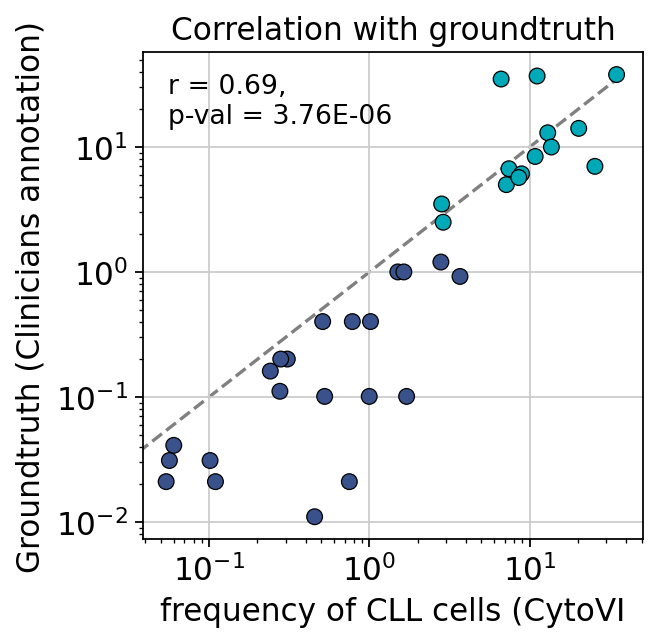

In [97]:
# correlate CLL cells freq with GT
res_cases = res[res['group']=='cases']

r, p = pearsonr(res_cases['CLL cells'], res_cases['freq CLL cells among total'])

ax = plt.subplot()
g = sns.scatterplot(res_cases, x='CLL cells eps', y='freq CLL cells among total', ax=ax, edgecolor='black', hue='class', palette=group_colors, s = 50, zorder= 2)
g.set_title('Correlation with groundtruth')
x0, x1 = g.get_xlim()
y0, y1 = g.get_ylim()
lims = [max(x0, y0), min(x1, y1)]
g.plot(lims, lims, color="grey", linestyle="dashed", label="x=y", zorder=1)
ax.set_xlabel('frequency of CLL cells (CytoVI')
ax.set_ylabel('Groundtruth (Clinicians annotation)')
ax.text(0.05, 0.90, f'r = {r:.2f}, \np-val = {p:.2E}', transform=ax.transAxes,
        horizontalalignment='left', verticalalignment='center', fontsize=12)
plt.xscale('log')
plt.yscale('log')
plt.legend([],[], frameon = False)
plt.savefig(f'{figure_dir}scatterplot_query_model_CLL_MRD_vs_GT.pdf')

In [11]:
# combine query and reference data
adata_query.obs['model_type'] = 'query'
adata_query.obs['cell_type'] = adata_query.obs['imp_label'].copy()
adata_ref.obs['model_type'] = 'reference'
adata_ref.obs['imp_uncertainty'] = 0
adata_comb = ad.concat([adata_query, adata_ref])

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [12]:
adata_query

AnnData object with n_obs × n_vars = 31101042 × 10
    obs: 'filename', 'sample_id', 'donor', 'batch', 'sample_name', 'group', 'diagnosis', 'Matutes criteria max 5', 'freq CLL cells among total', 'freq of CLL cells among B cells', 'light chain restriction', 'note', 'Clin_Batch', 'Inclusion', 'class', '_scvi_batch', '_scvi_labels', 'imp_label', 'imp_uncertainty', 'model_type', 'cell_type'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_CytoVI'
    layers: 'raw', 'scaled', 'transformed'

In [13]:
# save to disk
adata_comb.write_h5ad('../data/raw/Flow cytometry/CLL/full_cohort/processed/2025-01-13_CLL_full_cohort_latent_annot_labels_transfered.h5ad')

In [3]:
# read again
adata_comb = ad.read_h5ad('../data/raw/Flow cytometry/CLL/full_cohort/processed/2025-01-13_CLL_full_cohort_latent_annot_labels_transfered.h5ad')
adata_comb.obs_names_make_unique()

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [21]:
# subsample and inspect latent
adata_comb_sub = cytovi.pp.subsample(adata_comb, n_obs = 100000, groupby = 'model_type')
sc.pp.neighbors(adata_comb_sub, use_rep="X_CytoVI", n_neighbors=20)
sc.tl.umap(adata_comb_sub, min_dist = 0.1)

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


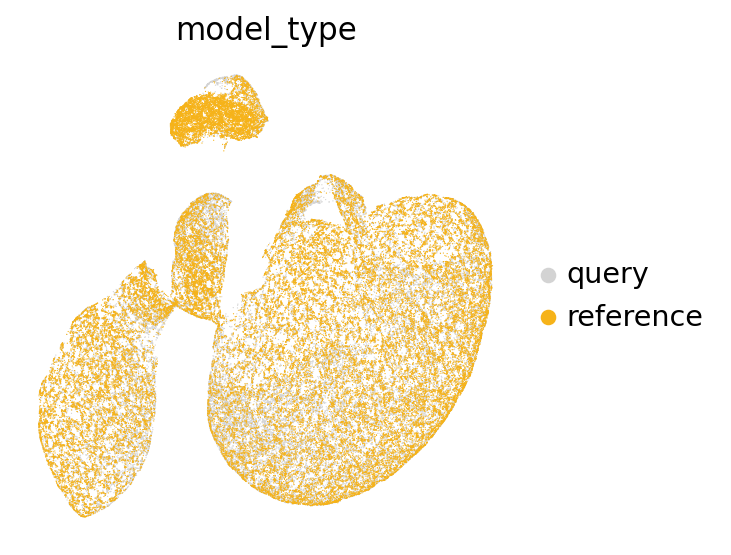

In [22]:
sc.pl.umap(adata_comb_sub, color = 'model_type', palette = {'reference': '#F6B319', 'query': 'lightgrey'}, frameon = False, save='query_reference.png')

Trying to modify attribute `._uns` of view, initializing view as actual.
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


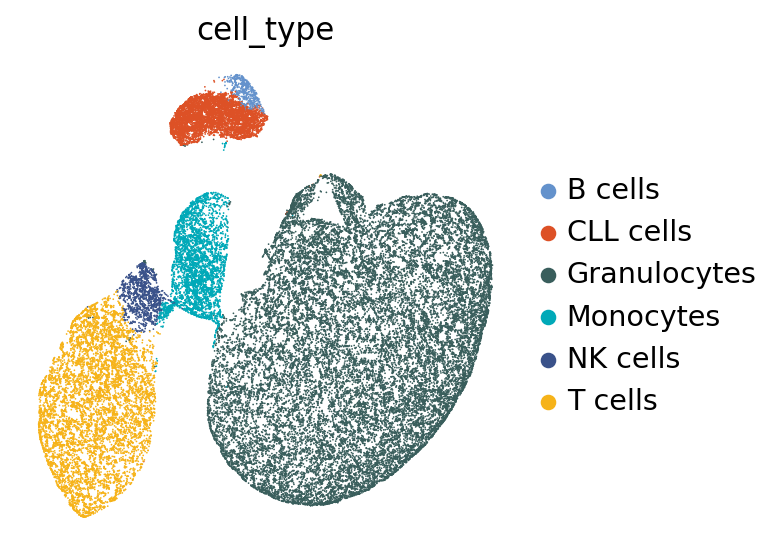

In [23]:
cell_type_colors = {
    'B cells': '#6492CC',  
    'CLL cells': '#DD5126',  
    'Granulocytes': '#395E5C',  
    'Monocytes': '#00A9B8',  #
    'NK cells': '#3A528A', 
    'T cells': '#F6B319',  
    'Unknown': 'lightgrey'
    }

sc.pl.umap(adata_comb_sub[adata_comb_sub.obs['model_type']=='reference'], color = ['cell_type'], palette = cell_type_colors, frameon = False, save= 'cell_types_reference_model.png')

Trying to modify attribute `._uns` of view, initializing view as actual.
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


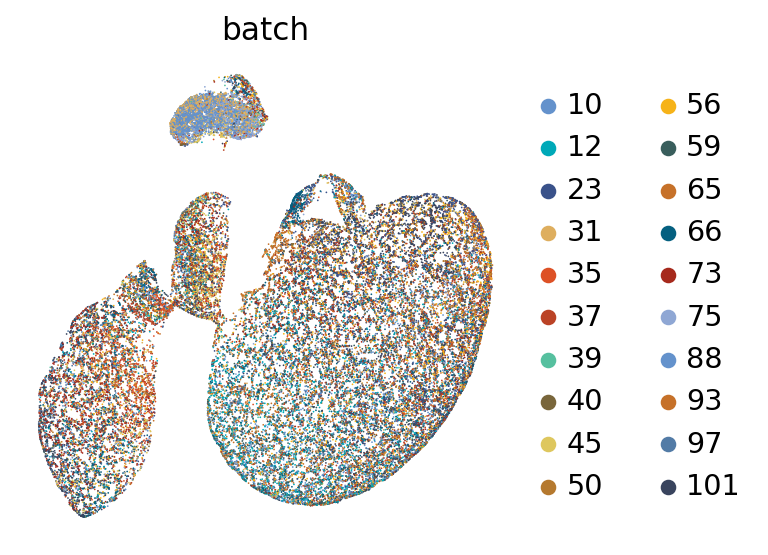

In [24]:
batch_cols = ['#6492CC', '#00A9B8', '#3A528A', '#DEAE5E', '#DD5126', '#BB4326', '#56C09F', '#79663B', '#DEC75E', '#B5792E', '#F6B319', '#395E5C', 
                '#C67129', '#056080', '#A6291C', '#8FA7D4', '#6492CC', '#C67129', '#527BA6', '#39445E', '#D3D3D3', '#5C6B8A', '#527F7D', '#4A6362',
                 '#B5722E', '#4D4E38', '#AD8533', '#A1462B']
sc.pl.umap(adata_comb_sub[adata_comb_sub.obs['model_type']=='reference'], color = ['batch'], palette = batch_cols, frameon = False, save= 'batch_reference_model.png')

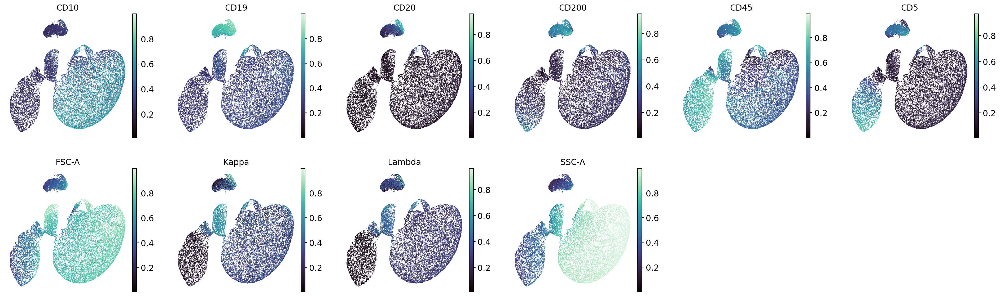

In [25]:
# plot markers on reference dataset
sc.pl.umap(adata_comb_sub[adata_comb_sub.obs['model_type']=='reference'], color = adata_comb_sub.var_names, cmap = 'mako', frameon = False, layer = 'scaled', save= 'marker_expression_reference_model.png', ncols = 6)

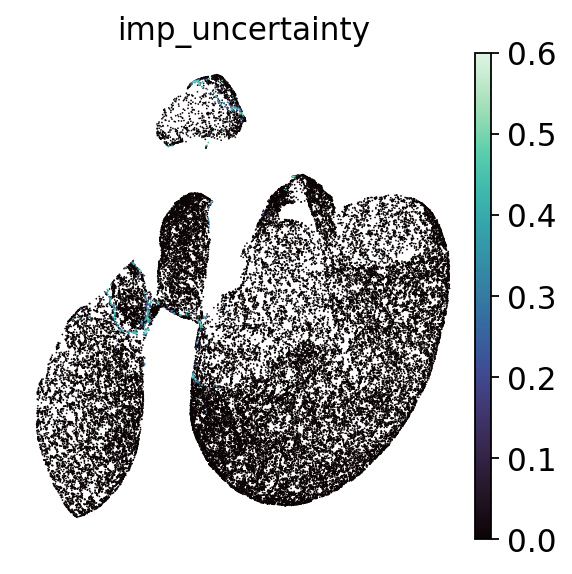

In [26]:
# plot markers on reference dataset
sc.pl.umap(adata_comb_sub[adata_comb_sub.obs['model_type']=='query'], color = 'imp_uncertainty', cmap = 'mako', frameon = False, layer = 'scaled', save= 'uncertainty_query_model.png', ncols = 6)

In [11]:
# compute umap on data space
adata_comb_sub.obsm['X_umap_CytoVI'] = adata_comb_sub.obsm['X_umap']
adata_comb_sub.X = adata_comb_sub.layers['scaled']
sc.pp.neighbors(adata_comb_sub)
sc.tl.umap(adata_comb_sub)

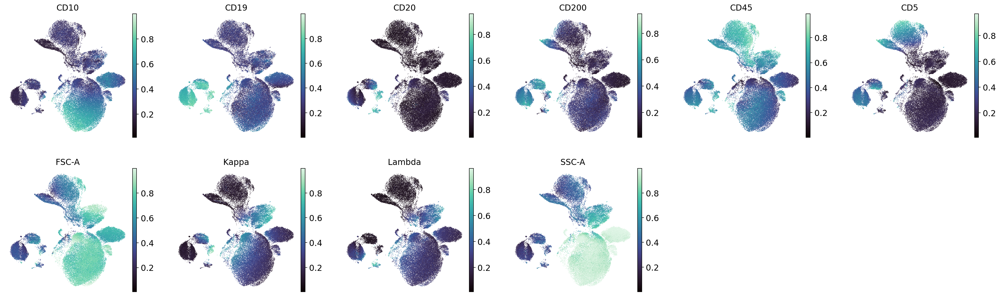

In [12]:
# plot markers on reference dataset
sc.pl.umap(adata_comb_sub[adata_comb_sub.obs['model_type']=='reference'], color = adata_comb_sub.var_names, cmap = 'mako', frameon = False, layer = 'scaled', save= 'marker_expression_reference_model_unintegrated.png', ncols = 6)

/home/labs/amit/floriani/mambaforge/envs/cytovi/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


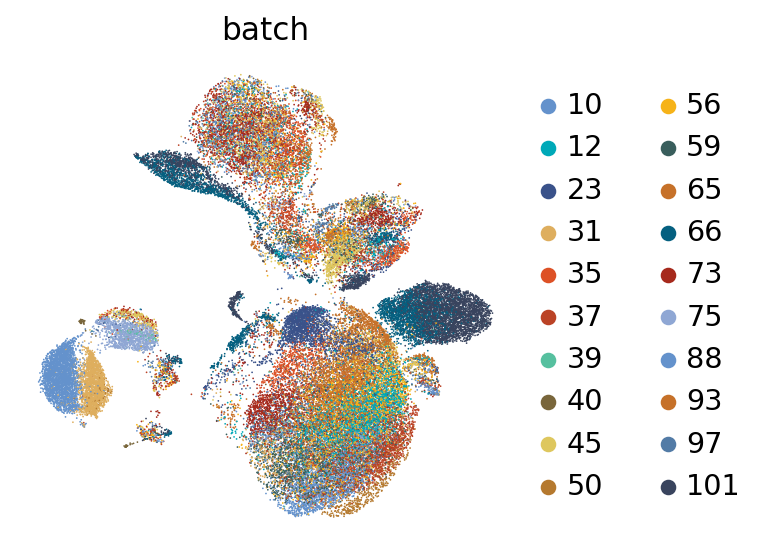

In [15]:
sc.pl.umap(adata_comb_sub[adata_comb_sub.obs['model_type']=='reference'], color = ['batch'], palette = batch_cols,frameon = False, save= 'batch_reference_model_unintegrated.png')

In [20]:
# save to disk
adata_comb_sub.write_h5ad('../data/raw/Flow cytometry/CLL/full_cohort/processed/2025-01-13_CLL_full_cohort_latent_annot_labels_transfered_sub.h5ad')